# Load necessary libraries

In [ ]:
import os
import gc
import copy

# Load all the necessary libraries
import numpy as np  # numerical computation with arrays
import pandas as pd # library to manipulate datasets using dataframes
import scipy as sp  # statistical library
from scipy import stats

# Load sklearn libraries for machine learning
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold ,RepeatedKFold
from sklearn.metrics import mean_squared_error
import lightgbm as lgb


# Load plotting libraries
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 18})
plt.style.use('ggplot')
import seaborn as sns

import shap

from sklearn.preprocessing import StandardScaler

import optuna.integration.lightgbm as lgbm
import optuna

import wandb

import warnings
warnings.filterwarnings('ignore')



# Load the data

In [ ]:
# Load the train dataset using pandas
train = pd.read_csv("train.csv.zip")
# Set column 'id' as the index of rows
#train = train.set_index('id')

In [ ]:
# Print first couple of rows of the train dataset
train.head()

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
0,1,State_1,Commercial,Grocery_store_or_food_market,61242.0,1942.0,11.0,2.4,36,50.5,...,14,0,0,0,1.0,1.0,1.0,NaN,248.682615,0
1,1,State_1,Commercial,Warehouse_Distribution_or_Shipping_center,274000.0,1955.0,45.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,26.500150,1
2,1,State_1,Commercial,Retail_Enclosed_mall,280025.0,1951.0,97.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,24.693619,2
3,1,State_1,Commercial,Education_Other_classroom,55325.0,1980.0,46.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,48.406926,3
4,1,State_1,Commercial,Warehouse_Nonrefrigerated,66000.0,1985.0,100.0,2.4,36,50.5,...,14,0,0,0,1.0,1.0,1.0,NaN,3.899395,4


In [ ]:
# Load the test dataset using pandas
test = pd.read_csv("test.csv.zip")

# Print first couple of rows of the test dataset
test.head()

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,...,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,id
0,7,State_1,Commercial,Grocery_store_or_food_market,28484.0,1994.0,37.0,2.4,38,50.596774,...,0,29,5,2,0,NaN,NaN,NaN,NaN,75757
1,7,State_1,Commercial,Grocery_store_or_food_market,21906.0,1961.0,55.0,45.7,38,50.596774,...,0,29,5,2,0,NaN,NaN,NaN,NaN,75758
2,7,State_1,Commercial,Grocery_store_or_food_market,16138.0,1950.0,1.0,59.1,38,50.596774,...,0,29,5,2,0,NaN,NaN,NaN,NaN,75759
3,7,State_1,Commercial,Grocery_store_or_food_market,97422.0,1971.0,34.0,35.4,38,50.596774,...,0,29,5,2,0,NaN,NaN,NaN,NaN,75760
4,7,State_1,Commercial,Grocery_store_or_food_market,61242.0,1942.0,35.0,1.8,38,50.596774,...,0,29,5,2,0,340.0,330.0,22.8,126.0,75761


# Exploratory data analysis

- Use Pandas package to read and display data
- Explore the columns of the dataset (e.g. target and features)
- Explore patterns and trends in the data through data visualization

### Numerical/Categorical Values

In [ ]:
categorical_features = ['State_Factor', 'building_class', 'facility_type']
numerical_features=train.select_dtypes('number').columns

### Compute basic properties of the dataset

#### The train dataset

In [ ]:
# shape of the train dataset

train.shape

(75757, 64)

In [ ]:
# train columns

list(train.columns)

['Year_Factor',
 'State_Factor',
 'building_class',
 'facility_type',
 'floor_area',
 'year_built',
 'energy_star_rating',
 'ELEVATION',
 'january_min_temp',
 'january_avg_temp',
 'january_max_temp',
 'february_min_temp',
 'february_avg_temp',
 'february_max_temp',
 'march_min_temp',
 'march_avg_temp',
 'march_max_temp',
 'april_min_temp',
 'april_avg_temp',
 'april_max_temp',
 'may_min_temp',
 'may_avg_temp',
 'may_max_temp',
 'june_min_temp',
 'june_avg_temp',
 'june_max_temp',
 'july_min_temp',
 'july_avg_temp',
 'july_max_temp',
 'august_min_temp',
 'august_avg_temp',
 'august_max_temp',
 'september_min_temp',
 'september_avg_temp',
 'september_max_temp',
 'october_min_temp',
 'october_avg_temp',
 'october_max_temp',
 'november_min_temp',
 'november_avg_temp',
 'november_max_temp',
 'december_min_temp',
 'december_avg_temp',
 'december_max_temp',
 'cooling_degree_days',
 'heating_degree_days',
 'precipitation_inches',
 'snowfall_inches',
 'snowdepth_inches',
 'avg_temp',
 'days_bel

In [ ]:
# data tyes - train

train.dtypes.value_counts()

int64      37
float64    24
object      3
dtype: int64

In [ ]:
# Get information on each column in the train dataset
# The 'Non-Null Count' counts the number of values in each column that is not missing
# Dtype indicates the variable type (e.g. integer, float, object)
# Here we see that some columns have missing values, so we have to do imputation
train.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75757 entries, 0 to 75756
Data columns (total 64 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Year_Factor                75757 non-null  int64  
 1   State_Factor               75757 non-null  object 
 2   building_class             75757 non-null  object 
 3   facility_type              75757 non-null  object 
 4   floor_area                 75757 non-null  float64
 5   year_built                 73920 non-null  float64
 6   energy_star_rating         49048 non-null  float64
 7   ELEVATION                  75757 non-null  float64
 8   january_min_temp           75757 non-null  int64  
 9   january_avg_temp           75757 non-null  float64
 10  january_max_temp           75757 non-null  int64  
 11  february_min_temp          75757 non-null  int64  
 12  february_avg_temp          75757 non-null  float64
 13  february_max_temp          75757 non-null  int

In [ ]:
# train columns with null

null_count_train = train.isnull().sum()
null_count_train[null_count_train > 0]

year_built                    1837
energy_star_rating           26709
direction_max_wind_speed     41082
direction_peak_wind_speed    41811
max_wind_speed               41082
days_with_fog                45796
dtype: int64

In [ ]:
null_count_train_percent = (null_count_train/len(train))*100
null_count_train_percent[null_count_train_percent > 0]

year_built                    2.424858
energy_star_rating           35.256148
direction_max_wind_speed     54.228652
direction_peak_wind_speed    55.190939
max_wind_speed               54.228652
days_with_fog                60.451179
dtype: float64

In [ ]:
# basic stats of features
train.describe()

,Year_Factor,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
count,75757.000000,7.575700e+04,73920.000000,49048.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,...,75757.000000,75757.000000,75757.000000,75757.000000,34675.000000,33946.000000,34675.000000,29961.000000,75757.000000,75757.000000
mean,4.367755,1.659839e+05,1952.306764,61.048605,39.506323,11.432343,34.310468,59.054952,11.720567,35.526837,...,82.709809,14.058701,0.279539,0.002442,66.552675,62.779974,4.190601,109.142051,82.584693,37878.000000
std,1.471441,2.468758e+05,37.053619,28.663683,60.656596,9.381027,6.996108,5.355458,12.577272,8.866697,...,25.282913,10.943996,2.252323,0.142140,131.147834,130.308106,6.458789,50.699751,58.255403,21869.306509
min,1.000000,9.430000e+02,0.000000,0.000000,-6.400000,-19.000000,10.806452,42.000000,-13.000000,13.250000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,12.000000,1.001169,0.000000
25%,3.000000,6.237900e+04,1927.000000,40.000000,11.900000,6.000000,29.827586,56.000000,2.000000,31.625000,...,72.000000,6.000000,0.000000,0.000000,1.000000,1.000000,1.000000,88.000000,54.528601,18939.000000
50%,5.000000,9.136700e+04,1951.000000,67.000000,25.000000,11.000000,34.451613,59.000000,9.000000,34.107143,...,84.000000,12.000000,0.000000,0.000000,1.000000,1.000000,1.000000,104.000000,75.293716,37878.000000
75%,6.000000,1.660000e+05,1977.000000,85.000000,42.700000,13.000000,37.322581,62.000000,20.000000,40.879310,...,97.000000,17.000000,0.000000,0.000000,1.000000,1.000000,1.000000,131.000000,97.277534,56817.000000
max,6.000000,6.385382e+06,2015.000000,100.000000,1924.500000,49.000000,64.758065,91.000000,48.000000,65.107143,...,260.000000,185.000000,119.000000,16.000000,360.000000,360.000000,23.300000,311.000000,997.866120,75756.000000



#### The test dataset

In [ ]:
# shape of the test dataset

test.shape

(9705, 63)

In [ ]:
# test columns

list(test.columns)

['Year_Factor',
 'State_Factor',
 'building_class',
 'facility_type',
 'floor_area',
 'year_built',
 'energy_star_rating',
 'ELEVATION',
 'january_min_temp',
 'january_avg_temp',
 'january_max_temp',
 'february_min_temp',
 'february_avg_temp',
 'february_max_temp',
 'march_min_temp',
 'march_avg_temp',
 'march_max_temp',
 'april_min_temp',
 'april_avg_temp',
 'april_max_temp',
 'may_min_temp',
 'may_avg_temp',
 'may_max_temp',
 'june_min_temp',
 'june_avg_temp',
 'june_max_temp',
 'july_min_temp',
 'july_avg_temp',
 'july_max_temp',
 'august_min_temp',
 'august_avg_temp',
 'august_max_temp',
 'september_min_temp',
 'september_avg_temp',
 'september_max_temp',
 'october_min_temp',
 'october_avg_temp',
 'october_max_temp',
 'november_min_temp',
 'november_avg_temp',
 'november_max_temp',
 'december_min_temp',
 'december_avg_temp',
 'december_max_temp',
 'cooling_degree_days',
 'heating_degree_days',
 'precipitation_inches',
 'snowfall_inches',
 'snowdepth_inches',
 'avg_temp',
 'days_bel

In [ ]:
# data types - test

test.dtypes.value_counts()

int64      37
float64    23
object      3
dtype: int64

In [ ]:
# Get information on each column in the test dataset
# The 'Non-Null Count' counts the number of values in each column that is not missing
# Dtype indicates the variable type (e.g. integer, float, object)
# Here we see that some columns have missing values, so we have to do imputation

test.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9705 entries, 0 to 9704
Data columns (total 63 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Year_Factor                9705 non-null   int64  
 1   State_Factor               9705 non-null   object 
 2   building_class             9705 non-null   object 
 3   facility_type              9705 non-null   object 
 4   floor_area                 9705 non-null   float64
 5   year_built                 9613 non-null   float64
 6   energy_star_rating         7451 non-null   float64
 7   ELEVATION                  9705 non-null   float64
 8   january_min_temp           9705 non-null   int64  
 9   january_avg_temp           9705 non-null   float64
 10  january_max_temp           9705 non-null   int64  
 11  february_min_temp          9705 non-null   int64  
 12  february_avg_temp          9705 non-null   float64
 13  february_max_temp          9705 non-null   int64

In [ ]:
#test columns with null

null_count_test = test.isnull().sum()
null_count_test[null_count_test > 0]

year_built                     92
energy_star_rating           2254
direction_max_wind_speed     8575
direction_peak_wind_speed    8575
max_wind_speed               8575
days_with_fog                9117
dtype: int64

In [ ]:
null_count_test_percent = (null_count_test/len(test))*100
null_count_test_percent[null_count_test_percent > 0]

year_built                    0.947965
energy_star_rating           23.225142
direction_max_wind_speed     88.356517
direction_peak_wind_speed    88.356517
max_wind_speed               88.356517
days_with_fog                93.941267
dtype: float64

In [ ]:
# basic stats of features

test.describe()

,Year_Factor,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,...,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,id
count,9705.0,9.705000e+03,9613.000000,7451.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,...,9705.000000,9705.000000,9705.000000,9705.000000,9705.0,1130.000000,1130.000000,1130.000000,588.000000,9705.000000
mean,7.0,1.632143e+05,1963.219598,64.712924,205.231190,13.520762,36.678081,60.008449,21.705100,41.634886,...,1.323029,66.820093,11.941267,0.211643,0.0,321.743363,310.194690,18.131327,150.755102,80609.000000
std,0.0,2.624759e+05,40.819953,27.935984,264.822814,12.458365,6.968520,5.874699,9.774624,5.528689,...,2.205729,30.936872,13.077936,0.615250,0.0,19.127690,38.969875,1.993348,58.760576,2801.736515
min,7.0,5.982000e+03,0.000000,1.000000,1.800000,-1.000000,27.548387,42.000000,9.000000,33.428571,...,0.000000,15.000000,1.000000,0.000000,0.0,280.000000,240.000000,14.800000,34.000000,75757.000000
25%,7.0,4.802000e+04,1929.000000,45.000000,26.500000,-1.000000,27.548387,54.000000,9.000000,36.053571,...,0.000000,39.000000,3.000000,0.000000,0.0,310.000000,270.000000,16.500000,129.000000,78183.000000
50%,7.0,8.248600e+04,1969.000000,72.000000,118.900000,15.000000,38.661290,59.000000,22.000000,41.625000,...,0.000000,77.000000,5.000000,0.000000,0.0,330.000000,320.000000,18.300000,129.000000,80609.000000
75%,7.0,1.775200e+05,1994.000000,88.000000,231.300000,21.000000,41.177419,64.000000,28.000000,45.685185,...,5.000000,79.000000,12.000000,0.000000,0.0,340.000000,340.000000,19.200000,138.000000,83035.000000
max,7.0,6.353396e+06,2016.000000,100.000000,812.000000,38.000000,50.596774,71.000000,40.000000,54.482143,...,5.000000,122.000000,41.000000,2.000000,0.0,360.000000,350.000000,23.300000,250.000000,85461.000000


## Data visualization

- Plot the distributions of the variables
- Explore associations between the target variable ("site_eui") and predictors (other columns)
- To do effective data exploration, it's important to understand what you're predicting - learn more about EUI (https://www.energystar.gov/buildings/benchmark/understand_metrics/what_eui). What does higher/lower "site_eui" mean?
- Explore associations between predictors (e.g. some predictors could be collinear)

In [ ]:
_deepnote_run_altair(train, """{"$schema":"https://vega.github.io/schema/vega-lite/v4.json","mark":{"type":"bar","tooltip":{"content":"data"}},"height":220,"autosize":{"type":"fit"},"data":{"name":"placeholder"},"encoding":{"x":{"field":"Year_Factor","type":"quantitative","sort":null,"scale":{"type":"linear","zero":false}},"y":{"field":"State_Factor","type":"nominal","sort":null,"scale":{"type":"linear","zero":true}},"color":{"field":"","type":"nominal","sort":null,"scale":{"type":"linear","zero":false}}}}""")

alt.Chart(...)

In [ ]:
_deepnote_run_altair(test, """{"$schema":"https://vega.github.io/schema/vega-lite/v4.json","mark":{"type":"bar","tooltip":{"content":"data"}},"height":220,"autosize":{"type":"fit"},"data":{"name":"placeholder"},"encoding":{"x":{"field":"Year_Factor","type":"quantitative","sort":null,"scale":{"type":"linear","zero":false}},"y":{"field":"State_Factor","type":"nominal","sort":null,"scale":{"type":"linear","zero":true}},"color":{"field":"","type":"nominal","sort":null,"scale":{"type":"linear","zero":false}}}}""")

alt.Chart(...)

##### Explore the target variable - "site_eui" for:

- Outliers
- Expected associations of the target with predictors based on prior knowledge about buildings

<AxesSubplot:xlabel='site_eui'>

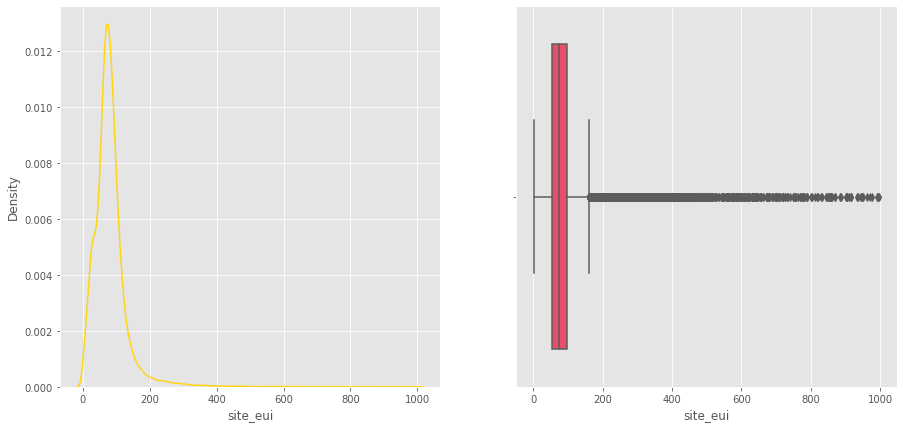

In [ ]:
# Plot the distribution
# Hint https://seaborn.pydata.org/tutorial/distributions.html
# sns.displot(x="site_eui", data=train, stat="density")

plt.figure(figsize=(15, 7))
plt.subplot(121)
sns.kdeplot(train.site_eui , color = "#ffd514")
plt.subplot(122)
sns.boxplot(train.site_eui , color = "#ff355d")

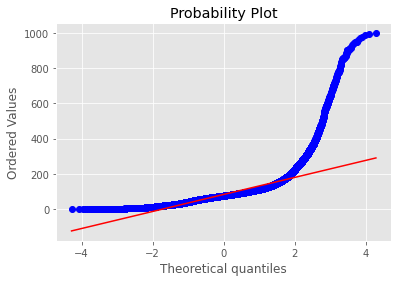

In [ ]:
res = stats.probplot(train['site_eui'], plot=plt)

##### Explore predictors

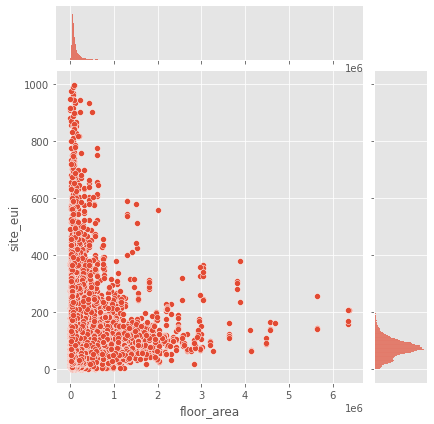

In [ ]:
# Scatterplot using seaborn (sns) library
# Hint: https://seaborn.pydata.org/generated/seaborn.jointplot.html

sns.jointplot(data=train, x="floor_area", y="site_eui")

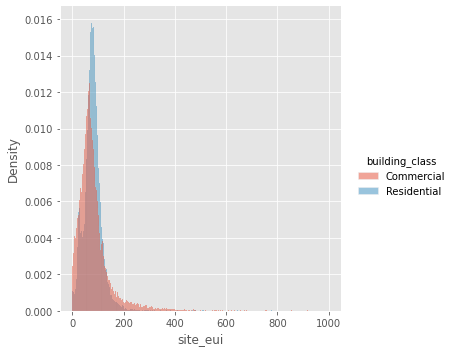

In [ ]:
# Plot the distribution of target variable sliced by different categorical variables.
# Hint https://seaborn.pydata.org/tutorial/distributions.html
# Since the number of observations is very different for Commercial vs Residential buildings, the counts for each subset is normalized independently (e.g. stat="density", common_norm=False)

sns.displot(x="site_eui", data=train, hue = "building_class", stat="density", common_norm=False)

In [ ]:
# Explore correlations between numerical features and the target variable
# Select only numerical (float) features

num_features = train.select_dtypes(include=['float64']).columns.values

# Compute correlations between all numerical features

train_corr = train[num_features].corr()

In [ ]:
# Sort features by their (absolute) correlation with the target variable.
# Here we see that "energy_star_rating" is highly correlated with site_eui (our target), so it might be a good predictor.

train_corr.sort_values(by='site_eui', key=abs, ascending=False)['site_eui']

site_eui                     1.000000
energy_star_rating          -0.511012
january_avg_temp            -0.167982
snowfall_inches              0.157284
february_avg_temp           -0.154071
march_avg_temp              -0.135303
july_avg_temp                0.133856
june_avg_temp                0.122019
august_avg_temp              0.113786
precipitation_inches         0.113558
april_avg_temp              -0.113008
september_avg_temp           0.108853
avg_temp                    -0.089201
floor_area                   0.073967
may_avg_temp                 0.072271
november_avg_temp           -0.069882
days_with_fog               -0.055388
december_avg_temp           -0.050328
october_avg_temp            -0.040162
year_built                   0.017162
direction_peak_wind_speed    0.013589
ELEVATION                    0.011798
max_wind_speed               0.010639
direction_max_wind_speed     0.010217
Name: site_eui, dtype: float64

<AxesSubplot:>

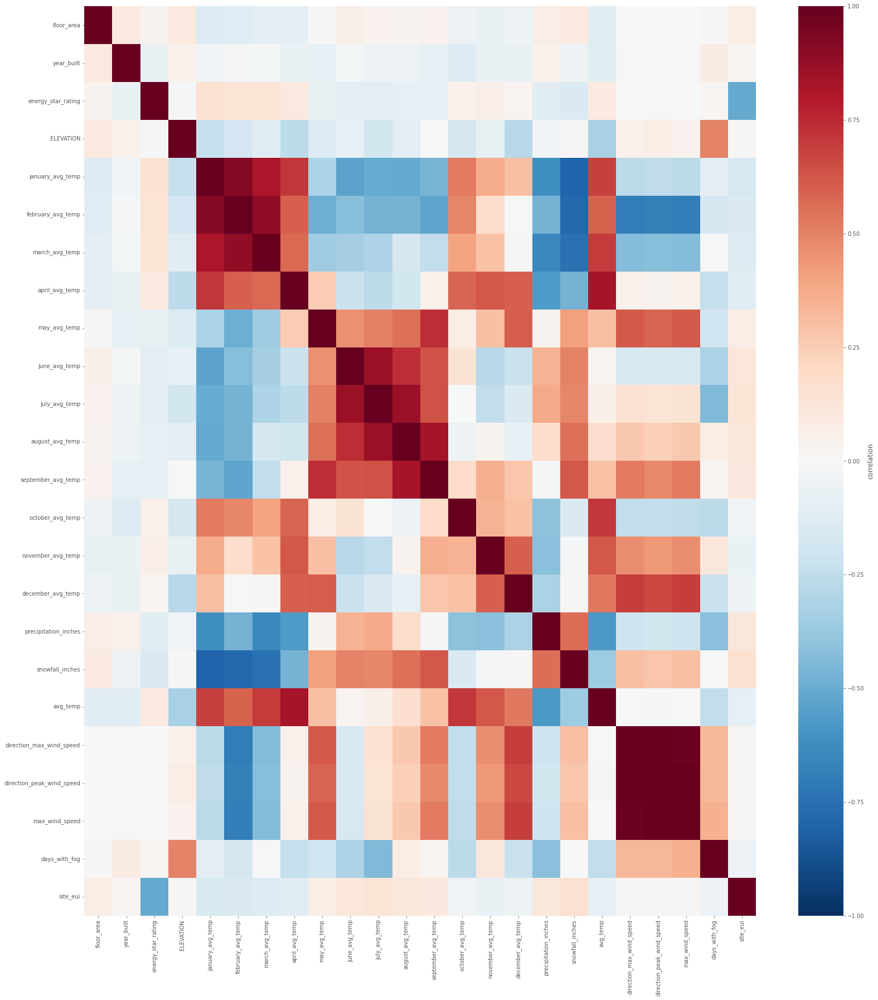

In [ ]:
# Plot correlations as a heatmap
# Here we notice that direction_max_wind_speed, direction_peak_wind_speed, and max_wind_speed are highly correlated with each other.
# This could indicate that we can drop some of these features.

fig, ax = plt.subplots(figsize=(27, 30))
sns.heatmap(train_corr, vmin=-1, vmax=1, cmap = 'RdBu_r', xticklabels=True, yticklabels=True, cbar_kws={'label' : 'correlation'}, ax=ax)

# Pre-process the data
- Impute missingness
- One-hot encoding or lable encoding for categorical predictors
- Scale the values of the predictors
- Feature selection
# Feature selection and engineering
- Create new features and remove irrelevant features
- Irrelevant features can include those that are irrelevant based on prior knowledge
- Irrelevant features can be those that do not vary across the dataset
- Features can be removed if they contain too many missing values or if they are collinear with others

In [ ]:
# Inspect your DataFrame, are there any covariates that are irrelevant for prediction? Drop unimportant covariates.
# From our correlation analysis above, we notice that direction_max_wind_speed and direction_peak_wind_speed are highly correlated.
# From their names, it also looks like they measure the same thing, so we can drop one of them.

# Drop features which have over 60% missing values in the train, test, or both datasets

train = train.drop(['days_with_fog','direction_peak_wind_speed','max_wind_speed','direction_max_wind_speed'], axis=1)
test = test.drop(['days_with_fog','direction_peak_wind_speed','max_wind_speed','direction_max_wind_speed'], axis=1)

### Impute missing values
- Impute (complete) missing values using e.g. scikit-learn (https://scikit-learn.org/stable/modules/impute.html)
- Imputation based on mean/median/mode of the variable
- Imputation based on k-nearest neighbors
- Imputation strategy depends on whether features are missing at random

In [ ]:
#code copied from https://www.kaggle.com/shrutisaxena/wids2022-starter-code

# year_built: replace with current year.
train['year_built'] =train['year_built'].replace(np.nan, 2000)
#replacing rest of the values with median
train['energy_star_rating']=train['energy_star_rating'].replace(np.nan,train['energy_star_rating'].median())
#train['direction_max_wind_speed']= train['direction_max_wind_speed'].replace(np.nan,train['direction_max_wind_speed'].median())
#train['direction_peak_wind_speed']= train['direction_peak_wind_speed'].replace(np.nan,train['direction_peak_wind_speed'].median())
#train['max_wind_speed']=train['max_wind_speed'].replace(np.nan,train['max_wind_speed'].median())
#train['days_with_fog']=train['days_with_fog'].replace(np.nan,train['days_with_fog'].median())

##for testdata

# year_built: replace with current year.
test['year_built'] =test['year_built'].replace(np.nan, 2000)
#replacing rest of the values with median
test['energy_star_rating']=test['energy_star_rating'].replace(np.nan,test['energy_star_rating'].median())
#test['direction_max_wind_speed']= test['direction_max_wind_speed'].replace(np.nan,test['direction_max_wind_speed'].median())
#test['direction_peak_wind_speed']= test['direction_peak_wind_speed'].replace(np.nan,test['direction_peak_wind_speed'].median())
#test['max_wind_speed']=test['max_wind_speed'].replace(np.nan,test['max_wind_speed'].mean())
#test['days_with_fog']=test['days_with_fog'].replace(np.nan,test['days_with_fog'].median())

### Label encoding

In [ ]:
le = LabelEncoder()

train['State_Factor']= le.fit_transform(train['State_Factor']).astype("uint8")
test['State_Factor']= le.fit_transform(test['State_Factor']).astype("uint8")

train['building_class']= le.fit_transform(train['building_class']).astype("uint8")
test['building_class']= le.fit_transform(test['building_class']).astype("uint8")

train['facility_type']= le.fit_transform(train['facility_type']).astype("uint8")
test['facility_type']= le.fit_transform(test['facility_type']).astype("uint8")

### Feature scaling

In [ ]:
target = train["site_eui"]
train = train.drop(["site_eui","id"],axis =1)
test_sc = test.drop(["id"],axis =1)

In [ ]:
trainnames = copy.deepcopy(train)
scaler = StandardScaler()
train = scaler.fit_transform(train)
test_sc = scaler.transform(test_sc)

### Hyperparameter tuning using Optuna

In [ ]:
rkf = RepeatedKFold(n_splits=3, n_repeats=3, random_state=42)

params = {
        "objective": "regression",
        "metric": "rmse",
        "verbosity": -1,
        "boosting_type": "gbdt",                
        "seed": 42
    }

X = copy.deepcopy(train)    
y = copy.deepcopy(target)

study_tuner = optuna.create_study(direction='minimize')
dtrain = lgbm.Dataset(X, label=y)

# Suppress information only outputs - otherwise optuna is 
# quite verbose, which can be nice, but takes up a lot of space
optuna.logging.set_verbosity(optuna.logging.WARNING) 

# Run optuna LightGBMTunerCV tuning of LightGBM with cross-validation
tuner = lgbm.LightGBMTunerCV(params, 
                            dtrain, 
                            study=study_tuner,
                            verbose_eval=False,                            
                            early_stopping_rounds=250,
                            time_budget=19800, # Time budget of 5 hours, we will not really need it
                            seed = 42,
                            folds=rkf,
                            num_boost_round=10000,
                            callbacks=[lgbm.reset_parameter(learning_rate = [0.005]*200 + [0.001]*9800) ] #[0.1]*5 + [0.05]*15 + [0.01]*45 + 
                           )

tuner.run()

[I 2022-02-25 21:41:21,628] A new study created in memory with name: no-name-54d03685-1db9-4b5f-8462-a8321e680a90
  0%|          | 0/5 [00:00<?, ?it/s]


In [ ]:
print(tuner.best_params)
# Classification error
print(tuner.best_score)
# Or expressed as accuracy
print(1.0-tuner.best_score)

{'objective': 'regression', 'metric': 'rmse', 'verbosity': -1, 'boosting_type': 'gbdt', 'seed': 42, 'feature_pre_filter': False, 'lambda_l1': 0.0, 'lambda_l2': 0.0, 'num_leaves': 87, 'feature_fraction': 1.0, 'bagging_fraction': 1.0, 'bagging_freq': 0, 'min_child_samples': 20}
41.684157027902046
-40.684157027902046


# Fit a model

In [ ]:
num_folds = 5
kf = KFold(n_splits = num_folds, shuffle = True, random_state = 42)
error = 0
models = []
for i, (train_index, val_index) in enumerate(kf.split(train)):
    if i + 1 < num_folds:
        continue
    print(train_index.max(), val_index.min())
    train_X = train[train_index]
    val_X = train[val_index]
    train_y = target[train_index]
    val_y = target[val_index]
    lgb_train = lgb.Dataset(train_X, train_y > 0)
    lgb_eval = lgb.Dataset(val_X, val_y > 0)
    params = {
            'boosting_type': 'gbdt',
            'objective': 'regression',
            'metric': {'rmse'},
            'learning_rate': 0.1,
            'feature_fraction': 0.8999999999999999,
            'bagging_fraction': 1.0,
            'bagging_freq' : 0
             
            }
    gbm_class = lgb.train(params,
                lgb_train,
                num_boost_round=2000,
                valid_sets=(lgb_train, lgb_eval),
               early_stopping_rounds=20,
               verbose_eval = 20)
    
    lgb_train = lgb.Dataset(train_X[train_y > 0], train_y[train_y > 0])
    lgb_eval = lgb.Dataset(val_X[val_y > 0] , val_y[val_y > 0])
    params = {
            'boosting_type': 'gbdt',
            'objective': 'regression',
            'metric': {'rmse'},
            'learning_rate': 0.1,
            'feature_fraction': 1.0,
            'bagging_fraction': 1.0,
            'bagging_freq' : 0
                         }
    gbm_regress = lgb.train(params,
                lgb_train,
                num_boost_round=2000,
                valid_sets=(lgb_train, lgb_eval),
               early_stopping_rounds=20,
               verbose_eval = 20)
#     models.append(gbm)

    y_pred = (gbm_class.predict(val_X, num_iteration=gbm_class.best_iteration) > .5) *\
    (gbm_regress.predict(val_X, num_iteration=gbm_regress.best_iteration))
    error += np.sqrt(mean_squared_error(y_pred, (val_y)))/num_folds
    print(np.sqrt(mean_squared_error(y_pred, (val_y))))
    break
print(error)

75756 2
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3778
[LightGBM] [Info] Number of data points in the train set: 60606, number of used features: 58
[LightGBM] [Info] Start training from score 1.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 20 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

### Feature Importance

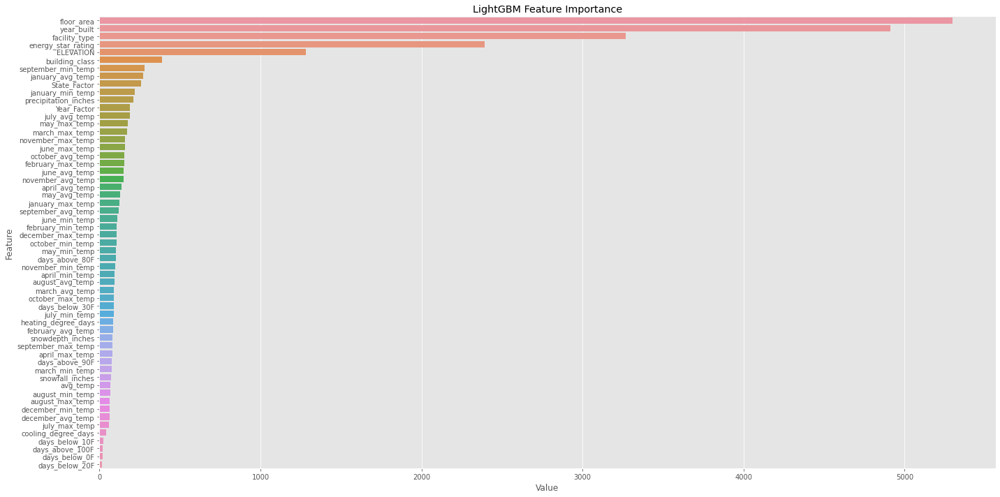

<Figure size 432x288 with 0 Axes>

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(gbm_regress.feature_importance(), trainnames.columns),reverse = True), columns=['Value','Feature'])
feature_imp = feature_imp[feature_imp.Value != 0]
plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Feature Importance')
plt.tight_layout()
plt.show()
plt.savefig('lgbm_importances-04.png')

### Shap values

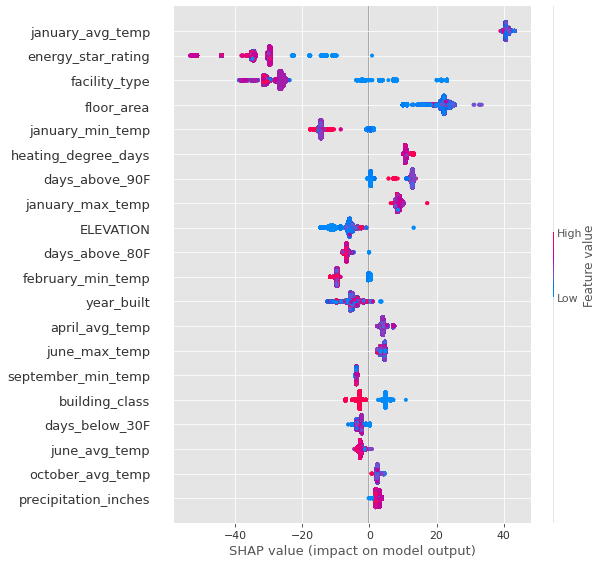

In [ ]:
shap_values = shap.TreeExplainer(gbm_regress).shap_values(trainnames)
shap.summary_plot(shap_values, trainnames)

### Prediction on the test dataset

In [ ]:
res = gbm_regress.predict(test_sc)

In [ ]:
TARGET_COL = "site_eui"
test[TARGET_COL] = res

#Read the predicting results
test[["id","site_eui"]]

,id,site_eui
0,75757,252.690145
1,75758,195.988724
2,75759,268.706048
3,75760,241.553124
4,75761,253.889857
...,...,...
9700,85457,42.540822
9701,85458,58.867857
9702,85459,80.537217
9703,85460,63.686521


In [ ]:
#Save the  predicting results in a csv submission file
test[["id","site_eui"]].to_csv("submission_AK_Eco_WoChiGo4.csv",index=False)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=28ea3d21-cee3-4608-9be4-abf27663e0ef' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>